In [33]:
# for this project i will be analyzing stock data from some popular banks
# using pandas-datareader library i will read in some data straight from yahoo finance

In [72]:
from pandas_datareader import data, wb
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_style('whitegrid')
import datetime
%matplotlib inline

import plotly
import cufflinks as cf
cf.go_offline()

In [37]:
# make datetime objects to grab stock data with
# start= jan 1, 2006 ; end = jan 1, 2016
start = datetime.datetime(2006,1,1)
end = datetime.datetime(2016,1,1)

In [39]:
# create a seperate dataframe for each bank stock data

# bank of america
BAC = data.DataReader('BAC','yahoo',start,end)

#CitiGroup
C = data.DataReader('C','yahoo',start,end)

#Goldman Sachs
GS = data.DataReader('GS','yahoo',start,end)

#JPMorgan Chase
JPM = data.DataReader('JPM','yahoo',start,end)

# Morgan Stanley
MS = data.DataReader('MS','yahoo',start,end)

# Wells Fargo
WFC = data.DataReader('WFC','yahoo',start,end)

In [41]:
# list of ticker symbols
tickers = ['BAC','C','GS','JPM','MS','WFC']

In [43]:
# concat all bank dataframes together using pd.concat
bank_stocks = pd.concat([BAC,C,GS,JPM,MS,WFC],axis=1,keys=tickers)

In [45]:
# set column name levels
bank_stocks.columns.names = ['Bank Ticker','Stock Info']

In [47]:
# heaad of bank stocks dataframe
bank_stocks.head()

Bank Ticker        BAC                                               \
Stock Info        High        Low       Open      Close      Volume   
Date                                                                  
2006-01-03   47.180000  46.150002  46.919998  47.080002  16296700.0   
2006-01-04   47.240002  46.450001  47.000000  46.580002  17757900.0   
2006-01-05   46.830002  46.320000  46.580002  46.639999  14970700.0   
2006-01-06   46.910000  46.349998  46.799999  46.570000  12599800.0   
2006-01-09   46.970001  46.360001  46.720001  46.599998  15619400.0   

Bank Ticker                      C                                      ...  \
Stock Info   Adj Close        High         Low        Open       Close  ...   
Date                                                                    ...   
2006-01-03   35.054218  493.799988  481.100006  490.000000  492.899994  ...   
2006-01-04   34.681938  491.000000  483.500000  488.600006  483.799988  ...   
2006-01-05   34.726604  487.799988  484.000000  484.399994  486.200012  ...   
2006-01-06   34.674480  489.000000  482.000000  488.799988  486.200012  ...   
2006-01-09   34.696808  487.399994  483.000000  486.000000  483.899994  ...   

Bank Ticker         MS                                         WFC             \
Stock Info        Open      Close     Volume  Adj Close       High        Low   
Date                                                                            
2006-01-03   57.169998  58.310001  5377000.0  37.399338  31.975000  31.195000   
2006-01-04   58.700001  58.349998  7977800.0  37.424999  31.820000  31.365000   
2006-01-05   58.549999  58.509998  5778000.0  37.527611  31.555000  31.309999   
2006-01-06   58.770000  58.570000  6889800.0  37.566090  31.775000  31.385000   
2006-01-09   58.630001  59.189999  4144500.0  37.963749  31.825001  31.555000   

Bank Ticker                                               
Stock Info        Open      Close      Volume  Adj Close  
Date                                                      
2006-01-03   31.600000  31.900000  11016400.0  20.904305  
2006-01-04   31.799999  31.530001  10870000.0  20.661839  
2006-01-05   31.500000  31.495001  10158000.0  20.638908  
2006-01-06   31.580000  31.680000   8403800.0  20.760138  
2006-01-09   31.674999  31.674999   5619600.0  20.756863  

[5 rows x 36 columns]

In [50]:
# will be using multi-level indexing and .xs() for most the project
# max close price for each bank's stock from 2006 - 2016
bank_stocks.xs(key='Close',axis=1,level='Stock Info').max()

Bank Ticker
BAC     54.900002
C      564.099976
GS     247.919998
JPM     70.080002
MS      89.300003
WFC     58.520000
dtype: float64

In [52]:
# creating a returns dataframe
returns = pd.DataFrame()

In [ ]:
# use pct_change() method on Close column to create a column representing this return value
for tick in tickers:
    returns[tick+' Return'] = bank_stocks[tick]['Close'].pct_change()
returns.head()

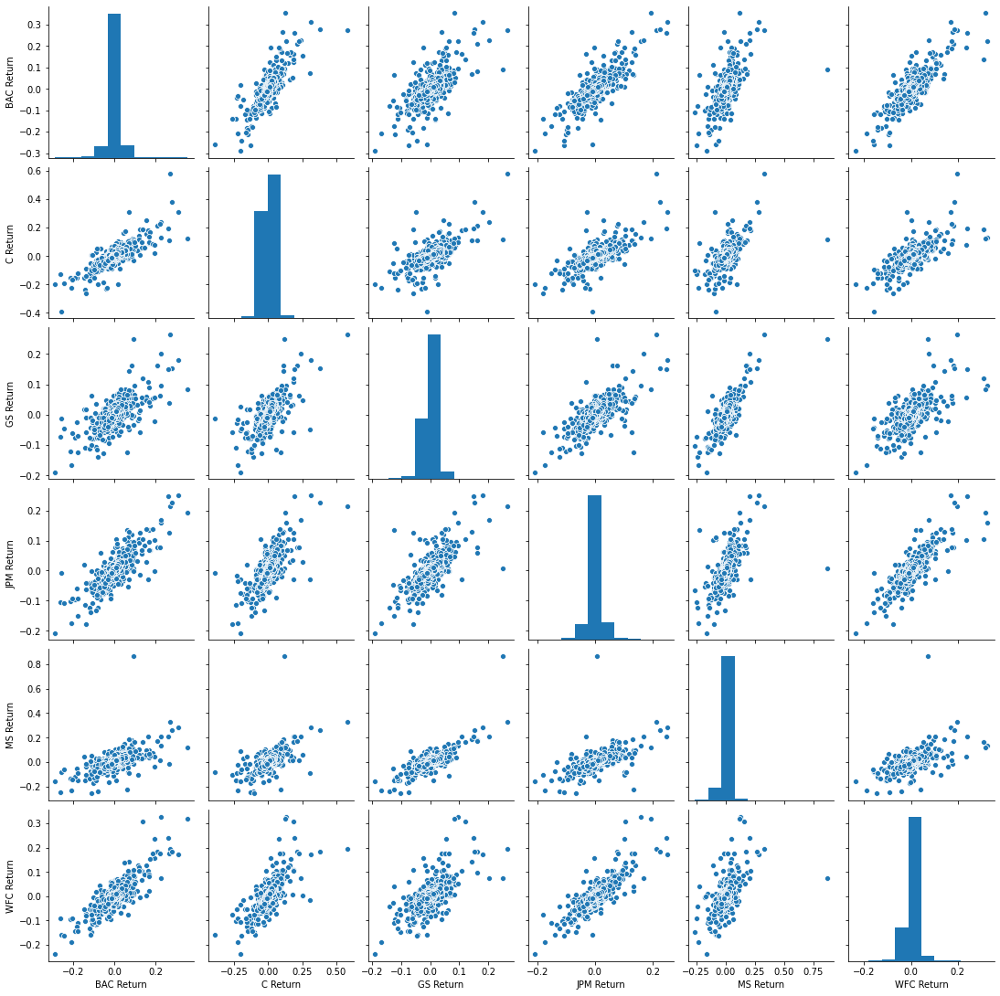

In [55]:
# create pairplot using seaborn of the returns dataframe
sns.pairplot(returns)

In [57]:
# what dates each bank stock had the best and worst single day returns

In [59]:
# worst drop in stock
returns.idxmin()

BAC Return   2009-01-20
C Return     2009-02-27
GS Return    2009-01-20
JPM Return   2009-01-20
MS Return    2008-10-09
WFC Return   2009-01-20
dtype: datetime64[ns]

In [60]:
# best single day gain
returns.idxmax()

BAC Return   2009-04-09
C Return     2008-11-24
GS Return    2008-11-24
JPM Return   2009-01-21
MS Return    2008-10-13
WFC Return   2008-07-16
dtype: datetime64[ns]

In [61]:
# standard deviation of stock returns
# Citigroup riskiest stock
returns.std()

BAC Return    0.036647
C Return      0.038672
GS Return     0.025390
JPM Return    0.027667
MS Return     0.037819
WFC Return    0.030238
dtype: float64

In [68]:
# standard deviation in 2015
# Morgan Stanley/Bank of America riskiest stocks
returns.loc['2015-01-01':'2015-12-31'].std()

BAC Return    0.016163
C Return      0.015289
GS Return     0.014046
JPM Return    0.014017
MS Return     0.016249
WFC Return    0.012591
dtype: float64

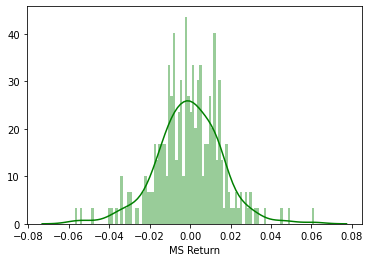

In [69]:
# create distplot using seaborn of the 2015 returns for Morgan Stanley
sns.distplot(returns.loc['2015-01-01':'2015-12-31']['MS Return'],color='green',bins=100)

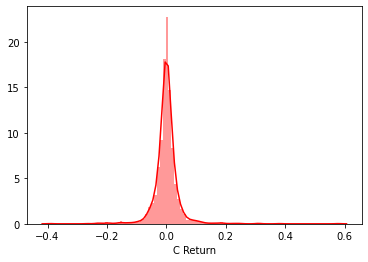

In [70]:
# distplot of citigroup in 2008
sns.distplot(returns.loc['2008-01-01':'2018-12-31']['C Return'],color='red',bins=100)

In [71]:
# More data visualization
# using seaborn, plotly, matplotlib, cufflinks, etc..

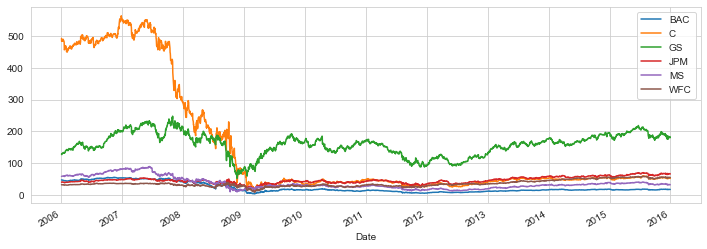

In [73]:
# line plot of Close price for each bank.
for tick in tickers:
    bank_stocks[tick]['Close'].plot(figsize=(12,4),label=tick)
plt.legend()

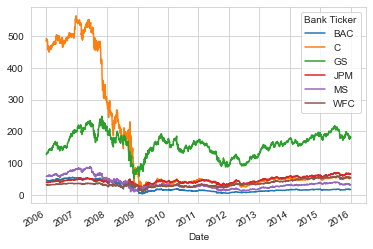

In [74]:
# using .xs() instead
bank_stocks.xs(key='Close',axis=1,level='Stock Info').plot()

In [75]:
# using plotly
bank_stocks.xs(key='Close',axis=1,level='Stock Info').iplot()

In [76]:
# moving averages **
# analyzing moving averages for these stocks in the year 2008

# plotting the rolling 30 day average against the Close price for Bank of america's stock for the year 2008

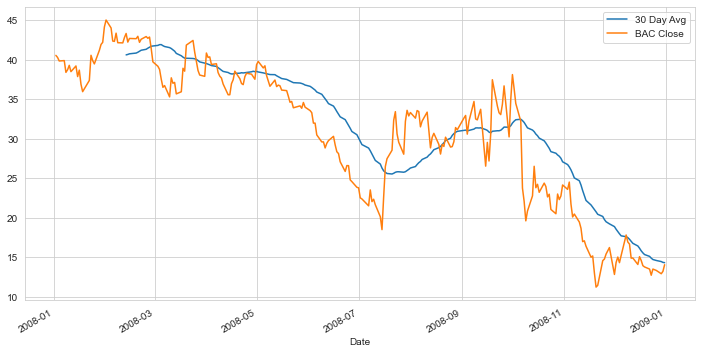

In [78]:
plt.figure(figsize=(12,6))
BAC['Close'].loc['2008-01-01':'2008-12-31'].rolling(window=30).mean().plot(label='30 Day Avg')
BAC['Close'].loc['2008-01-01':'2008-12-31'].plot(label='BAC Close')
plt.legend()

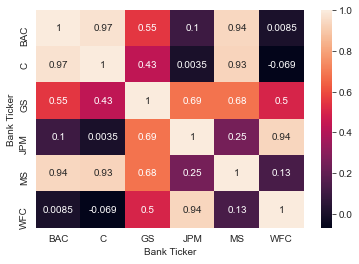

In [79]:
# heatmap of the correlation between the stocks Close Price
sns.heatmap(bank_stocks.xs(key='Close',axis=1,level='Stock Info').corr(),annot=True)

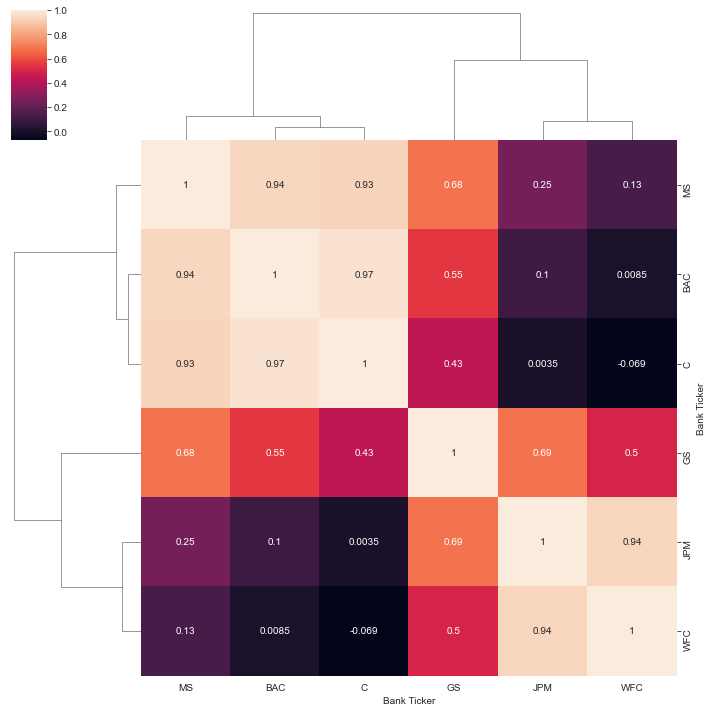

In [80]:
# clustermap of correlations
sns.clustermap(bank_stocks.xs(key='Close',axis=1,level='Stock Info').corr(),annot=True)

In [81]:
close_corr = bank_stocks.xs(key='Close',axis=1,level='Stock Info').corr()
close_corr.iplot(kind='heatmap',colorscale='rdylbu')

In [82]:
# Technical analysis plots

# candle plot of Bank of Americas stock from jan 1, 2015 - jan 1,2016

In [84]:
BAC[['Open', 'High', 'Low', 'Close']].loc['2015-01-01':'2016-01-01'].iplot(kind='candle')

In [86]:
# .ta_plot(study='sma) for simple moving average pot of morgan stanley for the year 2015
MS['Close'].loc['2015-01-01':'2016-01-01'].ta_plot(study='sma',periods=[13,21,55],title='Simple Moving Averages')

In [87]:
# ta_plot(study='boll) for a Bollinger band plot for bank of america for the year 2015
BAC['Close'].loc['2015-01-01':'2016-01-01'].ta_plot(study='boll')